In [3]:
import os, gc
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler
from inspect import getfile, getsource
from diffusers import (
    AutoencoderKL,
    DDPMScheduler,
    DiffusionPipeline,
    DPMSolverMultistepScheduler,
    DDIMScheduler,
    StableDiffusionPipeline,
    UNet2DConditionModel,
)
import torch
from transformers import AutoTokenizer, PretrainedConfig


In [ ]:
pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4"
pipeline = DiffusionPipeline.from_pretrained(pretrained_model_name_or_path, torch_dtype=torch.float16)


load_lora_weight_path = "data_root/logs/c.l4.kv_crybaby-50_lr2.5e-4_f0.5_b1g4/checkpoint-2500"
pipeline.load_lora_weights(load_lora_weight_path, weight_name="pytorch_lora_weights.safetensors")

device = "cuda:2"
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
pipeline.safety_checker = None
pipeline.requires_safety_checker = False
pipeline = pipeline.to("cuda:2")
pipeline.set_progress_bar_config(disable=True)
    

/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading pipeline components...: 100%|███████████████████████████████████████████| 7/7 [00:01<00:00,  4.61it/s]


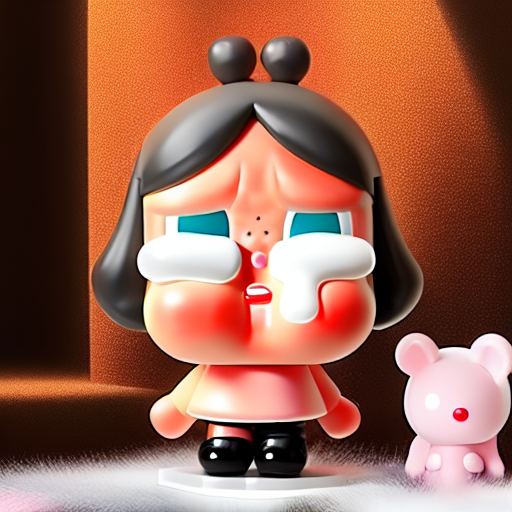

In [ ]:
seed = 0
generator = torch.Generator(device=device).manual_seed(seed) 

prompt = "A photo of a crybaby art toy"
display(pipeline(prompt,  generator=generator).images[0])

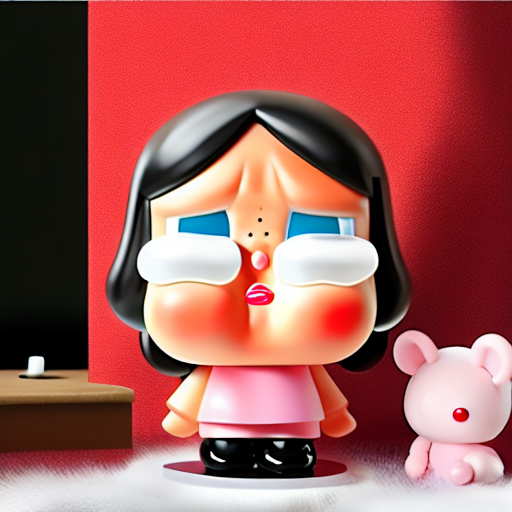

In [ ]:
seed = 0
generator = torch.Generator(device=device).manual_seed(seed) 

# lora scale = 0.9
lora_scale = 0.9
cross_attention_kwargs={"scale" : lora_scale}
prompt = "A photo of a crybaby art toy"
display(pipeline(prompt,  generator=generator, cross_attention_kwargs=cross_attention_kwargs).images[0])

In [34]:
import torch
import matplotlib.pyplot as plt

def display_cfg_variation_grid(pipeline, base_seed, cfg_scales, num_gen_img=5, prompt="A photo of a crybaby art toy", device="cuda"):
    """
    Displays a grid of images: rows = different seeds, columns = different cfg_scales
    """
    fig, axs = plt.subplots(num_gen_img, len(cfg_scales), figsize=(3 * len(cfg_scales), 3 * num_gen_img))
    if num_gen_img == 1:
        axs = [axs]  # Make iterable

    for row in range(num_gen_img):
        seed = base_seed + row  # Different seed per row
        for col, cfg in enumerate(cfg_scales):
            generator = torch.Generator(device=device).manual_seed(seed)
            image = pipeline(prompt, generator=generator, guidance_scale=cfg).images[0]

            ax = axs[row][col] if num_gen_img > 1 else axs[col]
            ax.imshow(image)
            ax.axis("off")
            if row == 0:
                ax.set_title(f"CFG: {cfg}")

    plt.tight_layout()
    plt.show()


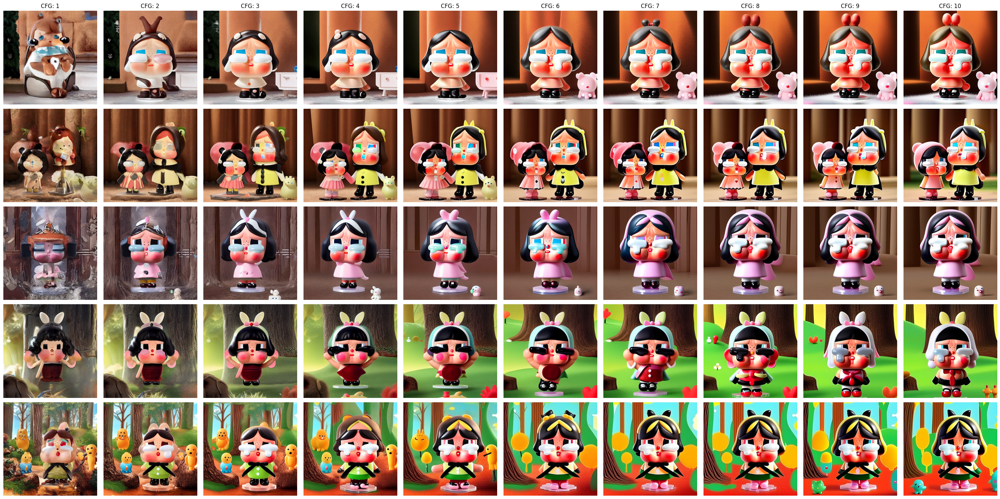

In [ ]:
cfg_scales = [1,2, 3, 4, 5, 6, 7,8, 9, 10]
base_seed = 0
display_cfg_variation_grid(pipeline,prompt,  base_seed=base_seed, cfg_scales=cfg_scales, num_gen_img=5)

In [31]:
import torch
import matplotlib.pyplot as plt

def display_lora_scale_variation_grid(pipeline, base_seed, lora_scales, num_gen_img=5, prompt="A photo of a crybaby art toy", device="cuda"):
    """
    Displays a grid of images: rows = different seeds, columns = different LoRA scales
    """
    fig, axs = plt.subplots(num_gen_img, len(lora_scales), figsize=(3 * len(lora_scales), 3 * num_gen_img))
    if num_gen_img == 1:
        axs = [axs]  # Make iterable

    for row in range(num_gen_img):
        seed = base_seed + row
        for col, scale in enumerate(lora_scales):
            generator = torch.Generator(device=device).manual_seed(seed)
            cross_attention_kwargs = {"scale": scale}
            image = pipeline(prompt, generator=generator, cross_attention_kwargs=cross_attention_kwargs).images[0]

            ax = axs[row][col] if num_gen_img > 1 else axs[col]
            ax.imshow(image)
            ax.axis("off")
            if row == 0:
                ax.set_title(f"LoRA: {scale}")

    plt.tight_layout()
    plt.show()


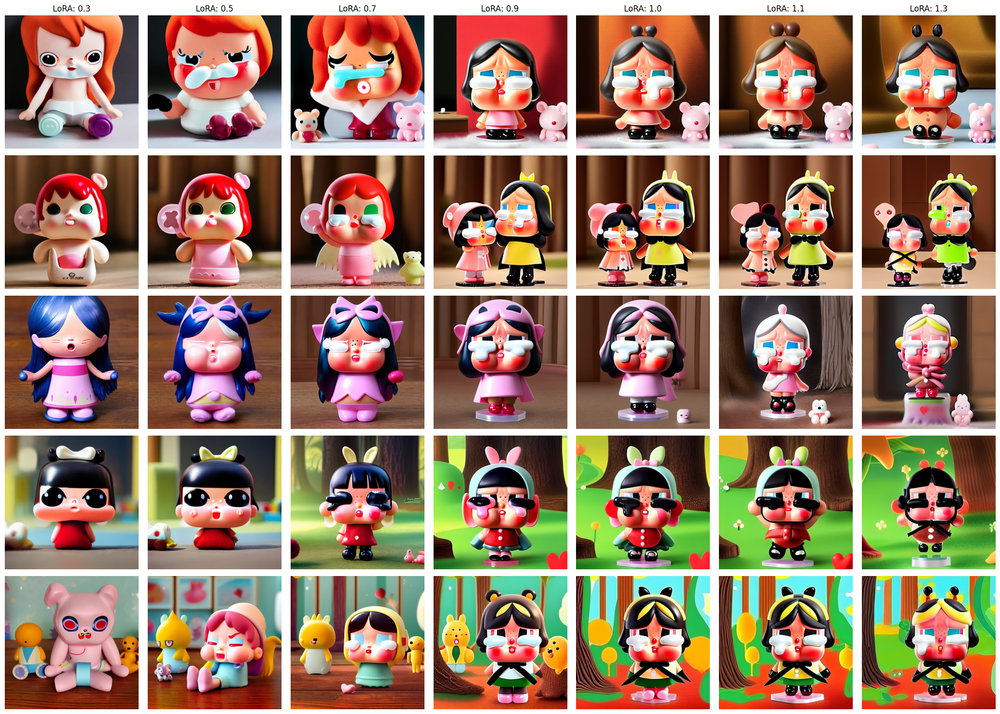

In [35]:
lora_scales = [0.3, 0.5, 0.7, 0.9,1.0,  1.1, 1.3]
display_lora_scale_variation_grid(pipeline, base_seed=0, lora_scales=lora_scales, num_gen_img=5)